In [1]:
!pip install torchmetrics -U

In [2]:
import numpy as np
import torch
import torchvision.transforms as tr
import matplotlib.pyplot as plt
import pandas as pd
import torchvision.models as models
import torchmetrics

import cv2
import os
from sklearn.model_selection import train_test_split, KFold
from IPython.display import clear_output
from torch.utils.data import Dataset
from torchvision import io
from torch import nn
from glob import glob
from tqdm.auto import tqdm

In [3]:
torch.cuda.is_available()

True

In [4]:
SEED = 1337
SPLIT_RATIO = 0.85
DEVICE = "cuda"
EPOCHS = 20
BATCH_SIZE = 32

np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

In [5]:
!rm -rf dataset dataset.zip
!gdown 11wp4Bm-hEVwmZq8GmqbLpKpJiqvDSNAe
!unzip dataset.zip
clear_output()

In [6]:
class SelfieDataset(Dataset):
    def __init__(
            self,
            image_paths,
            mask_paths,
            target_size=(256, 256),
            transform=None
    ):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.target_size = target_size
        self.transform = transform

    def __getitem__(self, idx):
        img = cv2.cvtColor(cv2.imread(self.image_paths[idx]), cv2.COLOR_BGR2RGB)
        msk = cv2.cvtColor(cv2.imread(self.mask_paths[idx]), cv2.COLOR_BGR2GRAY)

        msk[msk != 0] = 1

        img = cv2.resize(img, self.target_size)
        msk = cv2.resize(msk, self.target_size)

        if self.transform:
            img, msk = self.transform(img), self.transform(msk)

        return img, msk

    def __len__(self):
        return len(self.image_paths)

In [7]:
def normalize_to_tensor(image, **kwargs):
    if len(image.shape) == 3:
        image = image / 255
        image = image.transpose(2, 0, 1)
    return image.astype("float32")

def create_transform_pipeline():
    return tr.Compose([normalize_to_tensor])

def create_augmentation_pipeline():
    return tr.Compose([
        tr.ToPILImage(),
        tr.RandomHorizontalFlip(p=1.0),
        lambda x: np.asarray(x),
        normalize_to_tensor,
    ])


In [8]:
from pathlib import Path

images_path = np.array(sorted(Path("dataset/images").iterdir()))
masks_path = np.array(sorted(Path("dataset/masks").iterdir()))

train_size = int(len(images_path) * 0.8)

fully_dataset = SelfieDataset(image_paths=images_path, mask_paths=masks_path)
test_dataset = SelfieDataset(image_paths=images_path[train_size:], mask_paths=masks_path[train_size:], transform=create_transform_pipeline())
train_dataset = SelfieDataset(image_paths=images_path[:train_size], mask_paths=masks_path[:train_size], transform=create_transform_pipeline())

print("Full size", len(fully_dataset))
print("Train size:", len(train_dataset))
print("Test size:", len(test_dataset))

Full size 2000
Train size: 1600
Test size: 400


In [9]:
def show_images(images, column_titles=None, column_num=2):
  for j in range(len(images) // column_num):
    _, axes = plt.subplots(1, column_num, figsize=(8, 8))
    for i in range(column_num):
      img = images[j * column_num + i]
      ax = axes[i]
      ax.imshow(img)
      if column_titles is not None:
        ax.set_title(column_titles[i], fontsize=10)
      ax.axis('off')
    plt.tight_layout()
    plt.show()



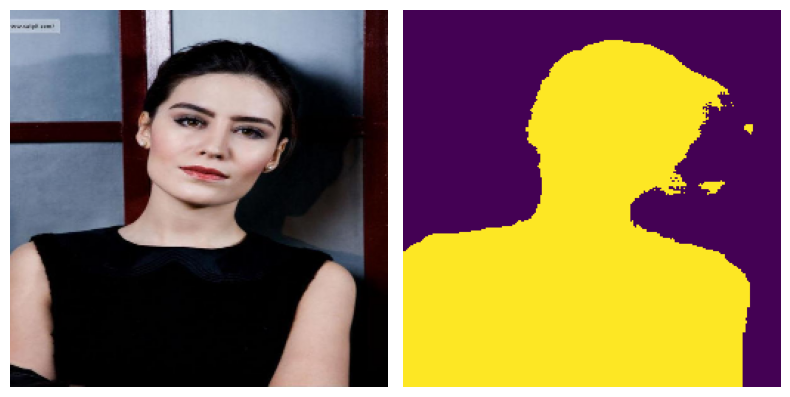

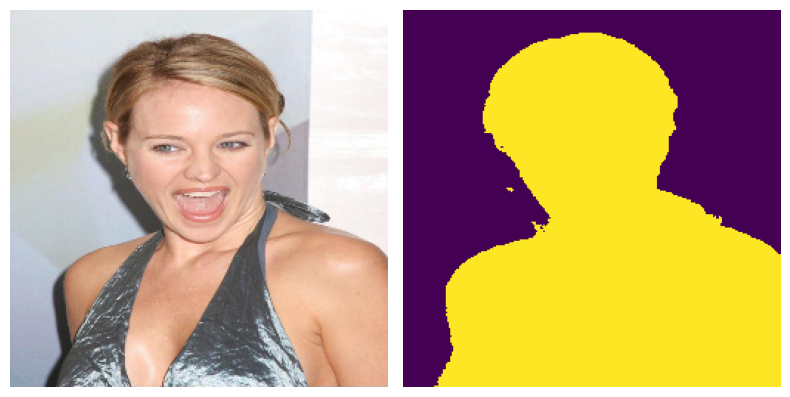

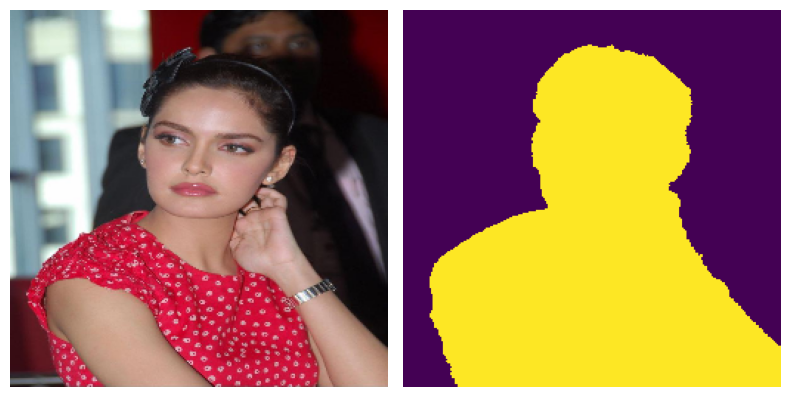

In [10]:
count = 3

for i in range(10, 10 + count):
  image, mask = fully_dataset[i]

  show_images([image, mask])

## Построение U-Net

In [11]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=0):
        super(ConvBlock, self).__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)

class ConvStack(nn.Module):
    def __init__(self, num_convs, in_channels, out_channels, padding):
          super(ConvStack, self).__init__()

          self.conv_layers = nn.ModuleList()
          for i in range(num_convs):
              self.conv_layers.append(ConvBlock(in_channels, out_channels, padding=padding))
              in_channels = out_channels

    def forward(self, x):
        for layer in self.conv_layers:
            x = layer(x)
        return x

class EncoderPath(nn.Module):
    def __init__(self, in_channels, out_channels, padding, depth=4):
        super(EncoderPath, self).__init__()

        self.encoder_blocks = nn.ModuleList()
        for _ in range(depth):
            self.encoder_blocks += [
                ConvStack(num_convs=2, in_channels=in_channels, out_channels=out_channels, padding=padding),
                nn.MaxPool2d(2, 2)
            ]

            in_channels = out_channels
            out_channels = 2 * out_channels

        self.encoder_blocks.append(
            ConvStack(num_convs=2, in_channels=in_channels, out_channels=out_channels, padding=padding)
        )

    def forward(self, x):
        skip_connections = []
        for layer in self.encoder_blocks:
            if isinstance(layer, ConvStack):
                x = layer(x)
                skip_connections.append(x)
            else:
                x = layer(x)
        return x, skip_connections

class DecoderPath(nn.Module):
    def __init__(self, in_channels, out_channels, final_channels, padding, depth=4):
        super(DecoderPath, self).__init__()

        self.final_channels = final_channels
        self.decoder_blocks = nn.ModuleList()

        for i in range(depth):
            self.decoder_blocks += [
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
                ConvStack(num_convs=2, in_channels=in_channels, out_channels=out_channels, padding=padding)
            ]

            in_channels //= 2
            out_channels //= 2

        self.decoder_blocks.append(nn.Conv2d(in_channels, self.final_channels, kernel_size=1, padding=0))

    def forward(self, x, skip_connections):
        skip_connections.pop(-1)
        for layer in self.decoder_blocks:
            if isinstance(layer, ConvStack):
                current_skip = skip_connections.pop(-1)
                x = torch.cat([x, current_skip], dim=1)
                x = layer(x)
            else:
                x = layer(x)
        return x

class UNet(nn.Module):
    def __init__(self, input_channels, initial_features, output_channels, depth=4, padding=1):
        super(UNet, self).__init__()
        self.encoder = EncoderPath(input_channels, initial_features, padding=padding, depth=depth)
        self.decoder = DecoderPath(
            initial_features * (2 ** depth),
            initial_features * (2 ** (depth - 1)),
            output_channels,
            padding=padding,
            depth=depth
        )

    def forward(self, x):
        enc_output, skip_connections = self.encoder(x)
        return self.decoder(enc_output, skip_connections)


## Обучение

In [12]:
criterion = nn.BCEWithLogitsLoss()
jaccard = torchmetrics.classification.BinaryJaccardIndex().to(DEVICE)

def jaccard_index(pred, y):
    return jaccard(pred, y > jaccard.threshold)

In [13]:
def train_model(model, optimizer, criterion, train_loader, val_loader):
    model = model.to(DEVICE)

    metrics = {
        "train_loss": [],
        "train_iou": [],
        "val_loss": [],
        "val_iou": []
    }

    for epoch in range(EPOCHS):
        model.train()
        epoch_train_loss = 0.0
        epoch_train_iou = 0.0

        for inputs, targets in tqdm(train_loader, desc=f"Training epoch {epoch+1}/{EPOCHS}"):
            inputs = inputs.to(DEVICE)
            targets = targets.to(DEVICE)

            optimizer.zero_grad()
            outputs = model(inputs).squeeze()
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

            batch_size = inputs.size(0)
            epoch_train_loss += loss.item() * batch_size
            epoch_train_iou += jaccard_index(outputs, targets) * batch_size

        epoch_train_loss /= len(train_loader.dataset)
        epoch_train_iou /= len(train_loader.dataset)
        metrics["train_loss"].append(epoch_train_loss)
        metrics["train_iou"].append(epoch_train_iou)

        model.eval()
        epoch_val_loss = 0.0
        epoch_val_iou = 0.0

        with torch.no_grad():
            for inputs, targets in tqdm(val_loader, desc=f"Validation epoch {epoch+1}/{EPOCHS}"):
                inputs = inputs.to(DEVICE)
                targets = targets.to(DEVICE)

                outputs = model(inputs).squeeze()
                loss = criterion(outputs, targets)

                batch_size = inputs.size(0)
                epoch_val_loss += loss.item() * batch_size
                epoch_val_iou += jaccard_index(outputs, targets) * batch_size

        epoch_val_loss /= len(val_loader.dataset)
        epoch_val_iou /= len(val_loader.dataset)
        metrics["val_loss"].append(epoch_val_loss)
        metrics["val_iou"].append(epoch_val_iou)

        print(f"Epoch {epoch+1}: "
              f"Train Loss: {epoch_train_loss:.4f}, Train IoU: {epoch_train_iou:.4f} | "
              f"Val Loss: {epoch_val_loss:.4f}, Val IoU: {epoch_val_iou:.4f}")

    return metrics


In [14]:
def visualize_training_history(history):
    # Convert all entries to floats, handling both tensors and Python numbers
    def to_floats(tensor_list):
        return [
            t.detach().cpu().item() if isinstance(t, torch.Tensor) else float(t)
            for t in tensor_list
        ]

    train_loss = to_floats(history["train_loss"])
    val_loss = to_floats(history["val_loss"])
    train_iou = to_floats(history["train_iou"])
    val_iou = to_floats(history["val_iou"])

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    epochs = range(1, len(train_loss) + 1)

    # Plot Loss
    axes[0].plot(epochs, train_loss, 'o-', color='red', linewidth=2, label='Training Loss')
    axes[0].plot(epochs, val_loss, 'o-', color='green', linewidth=2, label='Validation Loss')
    axes[0].set_title('Loss over epochs', fontsize=16, fontweight='bold')
    axes[0].set_xlabel('Epoch', fontsize=14)
    axes[0].set_ylabel('Loss Value', fontsize=14)
    axes[0].grid(True, linestyle='--', alpha=0.6)
    axes[0].legend(fontsize=12)

    # Plot IoU
    axes[1].plot(epochs, train_iou, 'o-', color='red', linewidth=2, label='Training IoU')
    axes[1].plot(epochs, val_iou, 'o-', color='green', linewidth=2, label='Validation IoU')
    axes[1].set_title('IoU over epochs', fontsize=16, fontweight='bold')
    axes[1].set_xlabel('Epoch', fontsize=14)
    axes[1].set_ylabel('IoU Score', fontsize=14)
    axes[1].grid(True, linestyle='--', alpha=0.6)
    axes[1].legend(fontsize=12)

    plt.tight_layout()
    plt.show()

In [15]:
def show_predictions(model, dataset, n=4, best=True):
    model.eval()
    results = []

    for i, (image, mask) in enumerate(dataset):
        with torch.no_grad():
            pred = model(torch.from_numpy(image).to(DEVICE).unsqueeze(0)).squeeze()
            score = jaccard_index(pred, torch.from_numpy(mask).to(DEVICE))
            results.append((score, i))

    selected_cases = sorted(results, key=lambda x: x[0], reverse=best)[:n]
    images = []

    for _, idx in selected_cases:
        image, mask = dataset[idx]
        with torch.no_grad():
            pred = model(torch.from_numpy(image).to(DEVICE).unsqueeze(0)).squeeze()
        pred_mask = (torch.sigmoid(pred) >= 0.5).float().cpu().numpy()

        # Добавляем три изображения подряд
        images.append(image.transpose(1, 2, 0))  # Original image
        images.append(pred_mask)                # Model prediction
        images.append(mask)                     # Ground truth mask

    show_images(images, column_titles=["Original Image", "Model Prediction", "Real Mask"], column_num=3)


In [16]:
model = UNet(3, 16, 1)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters())
BATCH_SIZE = 16

mini_train_loader = torch.utils.data.DataLoader(
    torch.utils.data.Subset(train_dataset, range(4)),
    batch_size=4,
    shuffle=True
)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

history = train_model(model, optimizer, criterion, mini_train_loader, val_loader)

Training epoch 1/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.8222, Train IoU: 0.1167 | Val Loss: 0.6944, Val IoU: 0.0000


Training epoch 2/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.7021, Train IoU: 0.1362 | Val Loss: 0.6943, Val IoU: 0.0000


Training epoch 3/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.6575, Train IoU: 0.2206 | Val Loss: 0.6941, Val IoU: 0.0000


Training epoch 4/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.6255, Train IoU: 0.3182 | Val Loss: 0.6940, Val IoU: 0.0000


Training epoch 5/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.5982, Train IoU: 0.4439 | Val Loss: 0.6937, Val IoU: 0.0000


Training epoch 6/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.5684, Train IoU: 0.5923 | Val Loss: 0.6932, Val IoU: 0.0000


Training epoch 7/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.5390, Train IoU: 0.6888 | Val Loss: 0.6926, Val IoU: 0.0000


Training epoch 8/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.5122, Train IoU: 0.7315 | Val Loss: 0.6916, Val IoU: 0.0000


Training epoch 9/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.4883, Train IoU: 0.7774 | Val Loss: 0.6908, Val IoU: 0.0000


Training epoch 10/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.4751, Train IoU: 0.8211 | Val Loss: 0.6900, Val IoU: 0.0000


Training epoch 11/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.4642, Train IoU: 0.8880 | Val Loss: 0.6913, Val IoU: 0.0003


Training epoch 12/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.4500, Train IoU: 0.8994 | Val Loss: 0.7023, Val IoU: 0.0008


Training epoch 13/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.4458, Train IoU: 0.9011 | Val Loss: 0.7277, Val IoU: 0.0012


Training epoch 14/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.4341, Train IoU: 0.9338 | Val Loss: 0.7457, Val IoU: 0.0023


Training epoch 15/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.4289, Train IoU: 0.9385 | Val Loss: 0.7565, Val IoU: 0.0055


Training epoch 16/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.4206, Train IoU: 0.9495 | Val Loss: 0.7708, Val IoU: 0.0141


Training epoch 17/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.4155, Train IoU: 0.9552 | Val Loss: 0.8194, Val IoU: 0.0241


Training epoch 18/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.4102, Train IoU: 0.9607 | Val Loss: 0.8693, Val IoU: 0.0354


Training epoch 19/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.4055, Train IoU: 0.9688 | Val Loss: 0.8514, Val IoU: 0.1041


Training epoch 20/20:   0%|          | 0/1 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.4014, Train IoU: 0.9711 | Val Loss: 0.8054, Val IoU: 0.2244


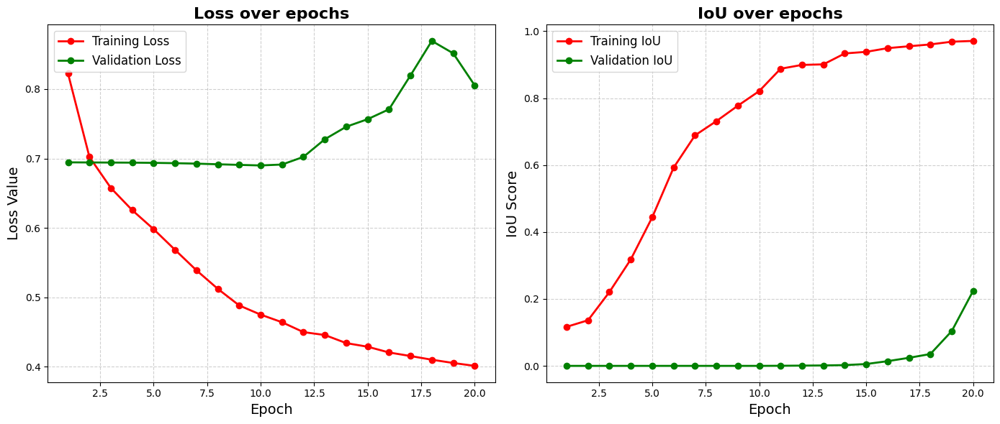

In [17]:
visualize_training_history(history)

### Переобучение на батче из 4 фото-селфи

### Worst cases

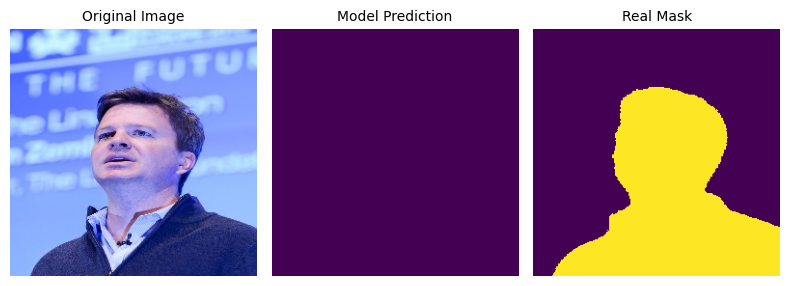

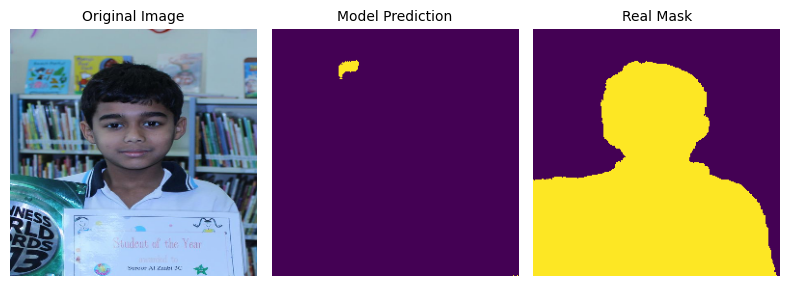

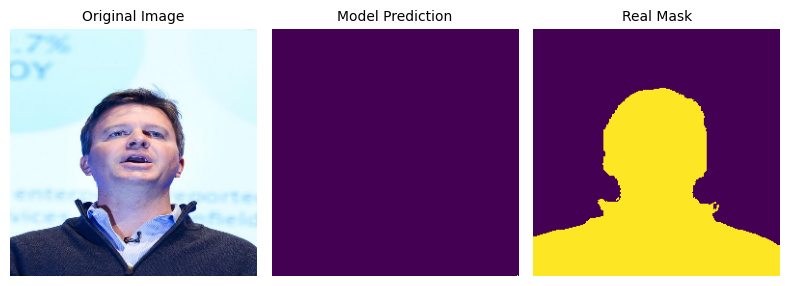

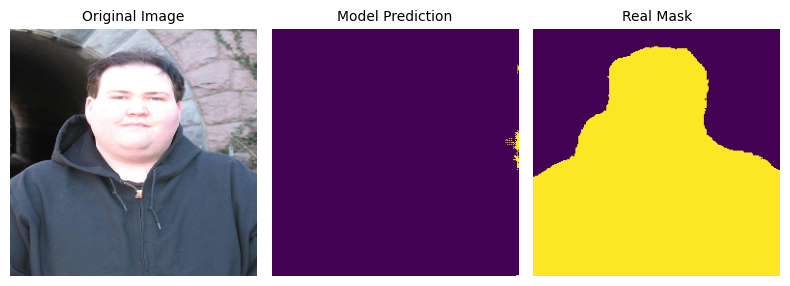

In [18]:
show_predictions(model, test_dataset, 4, best=False)

### Best cases

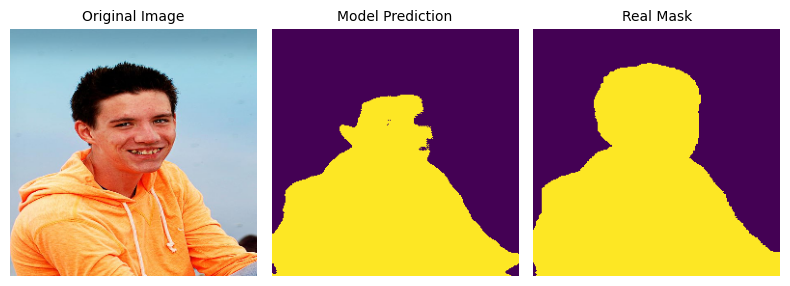

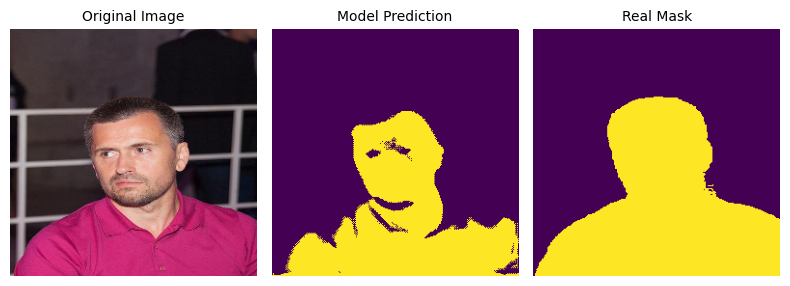

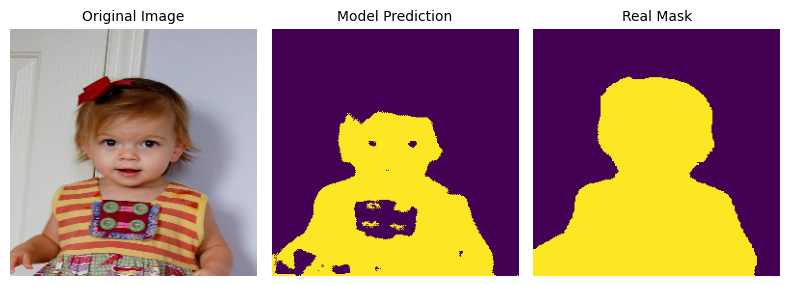

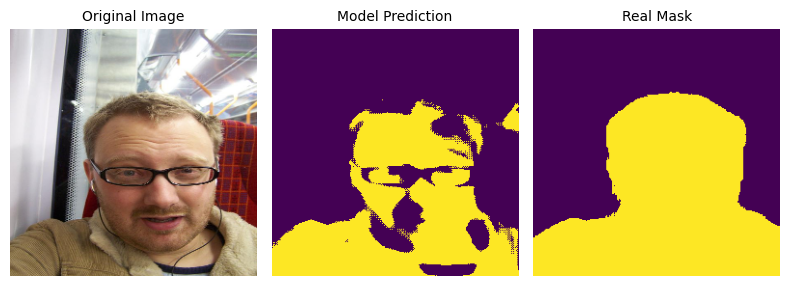

In [19]:
show_predictions(model, test_dataset, 4, best=True)

### Training on the full training dataset

In [20]:
model = UNet(3, 16, 1)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters())

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

history = train_model(model, optimizer, criterion, train_loader, val_loader)


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3917, Train IoU: 0.7628 | Val Loss: 0.2708, Val IoU: 0.8459


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.2000, Train IoU: 0.8836 | Val Loss: 0.1657, Val IoU: 0.8915


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.1493, Train IoU: 0.9060 | Val Loss: 0.1618, Val IoU: 0.8914


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.1193, Train IoU: 0.9221 | Val Loss: 0.1206, Val IoU: 0.9194


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0970, Train IoU: 0.9359 | Val Loss: 0.1147, Val IoU: 0.9197


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0865, Train IoU: 0.9421 | Val Loss: 0.0954, Val IoU: 0.9345


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0759, Train IoU: 0.9486 | Val Loss: 0.0972, Val IoU: 0.9309


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0703, Train IoU: 0.9528 | Val Loss: 0.0785, Val IoU: 0.9446


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0588, Train IoU: 0.9595 | Val Loss: 0.1204, Val IoU: 0.9135


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0539, Train IoU: 0.9634 | Val Loss: 0.0700, Val IoU: 0.9511


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0471, Train IoU: 0.9674 | Val Loss: 0.0736, Val IoU: 0.9477


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0439, Train IoU: 0.9699 | Val Loss: 0.0817, Val IoU: 0.9450


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0455, Train IoU: 0.9682 | Val Loss: 0.0765, Val IoU: 0.9481


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0387, Train IoU: 0.9731 | Val Loss: 0.0804, Val IoU: 0.9504


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0345, Train IoU: 0.9757 | Val Loss: 0.0803, Val IoU: 0.9471


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0364, Train IoU: 0.9743 | Val Loss: 0.0712, Val IoU: 0.9535


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0314, Train IoU: 0.9778 | Val Loss: 0.0688, Val IoU: 0.9556


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0347, Train IoU: 0.9750 | Val Loss: 0.0722, Val IoU: 0.9515


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0334, Train IoU: 0.9758 | Val Loss: 0.0901, Val IoU: 0.9437


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0289, Train IoU: 0.9790 | Val Loss: 0.0955, Val IoU: 0.9434


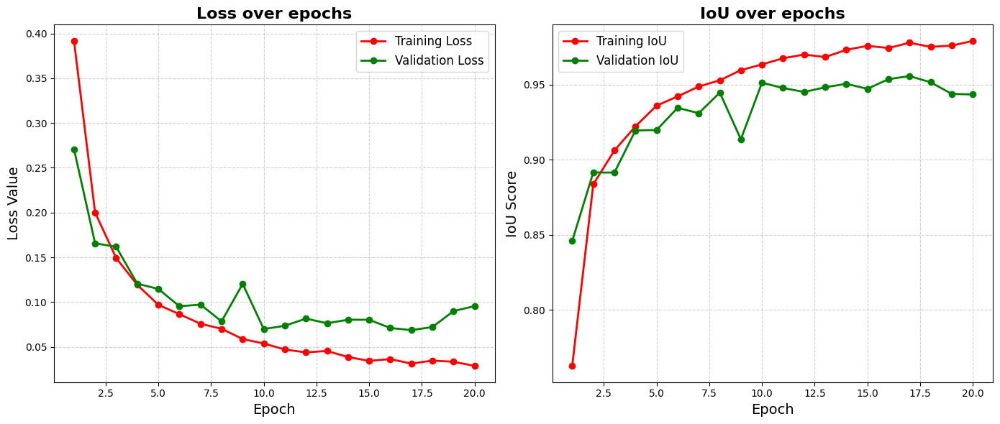

In [21]:
visualize_training_history(history)


In [23]:
train_images = images_path[:train_size]
train_masks = masks_path[:train_size]


### Training with data augmentation (horizontal flips)

Training epoch 1/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3238, Train IoU: 0.7925 | Val Loss: 0.1931, Val IoU: 0.8794


Training epoch 2/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1370, Train IoU: 0.9137 | Val Loss: 0.1277, Val IoU: 0.9124


Training epoch 3/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.0977, Train IoU: 0.9354 | Val Loss: 0.1043, Val IoU: 0.9289


Training epoch 4/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0797, Train IoU: 0.9460 | Val Loss: 0.0786, Val IoU: 0.9452


Training epoch 5/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0630, Train IoU: 0.9574 | Val Loss: 0.0765, Val IoU: 0.9470


Training epoch 6/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0547, Train IoU: 0.9623 | Val Loss: 0.0727, Val IoU: 0.9522


Training epoch 7/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0482, Train IoU: 0.9666 | Val Loss: 0.0637, Val IoU: 0.9548


Training epoch 8/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0426, Train IoU: 0.9699 | Val Loss: 0.0611, Val IoU: 0.9578


Training epoch 9/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0400, Train IoU: 0.9717 | Val Loss: 0.0608, Val IoU: 0.9549


Training epoch 10/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0375, Train IoU: 0.9733 | Val Loss: 0.0566, Val IoU: 0.9593


Training epoch 11/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0351, Train IoU: 0.9747 | Val Loss: 0.0582, Val IoU: 0.9611


Training epoch 12/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0294, Train IoU: 0.9787 | Val Loss: 0.0633, Val IoU: 0.9594


Training epoch 13/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0285, Train IoU: 0.9791 | Val Loss: 0.0541, Val IoU: 0.9634


Training epoch 14/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0269, Train IoU: 0.9802 | Val Loss: 0.0595, Val IoU: 0.9632


Training epoch 15/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0272, Train IoU: 0.9801 | Val Loss: 0.0608, Val IoU: 0.9600


Training epoch 16/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0282, Train IoU: 0.9792 | Val Loss: 0.0532, Val IoU: 0.9656


Training epoch 17/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0229, Train IoU: 0.9829 | Val Loss: 0.0552, Val IoU: 0.9666


Training epoch 18/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0210, Train IoU: 0.9843 | Val Loss: 0.0471, Val IoU: 0.9703


Training epoch 19/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0198, Train IoU: 0.9850 | Val Loss: 0.0530, Val IoU: 0.9672


Training epoch 20/20:   0%|          | 0/200 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0217, Train IoU: 0.9837 | Val Loss: 0.0728, Val IoU: 0.9570


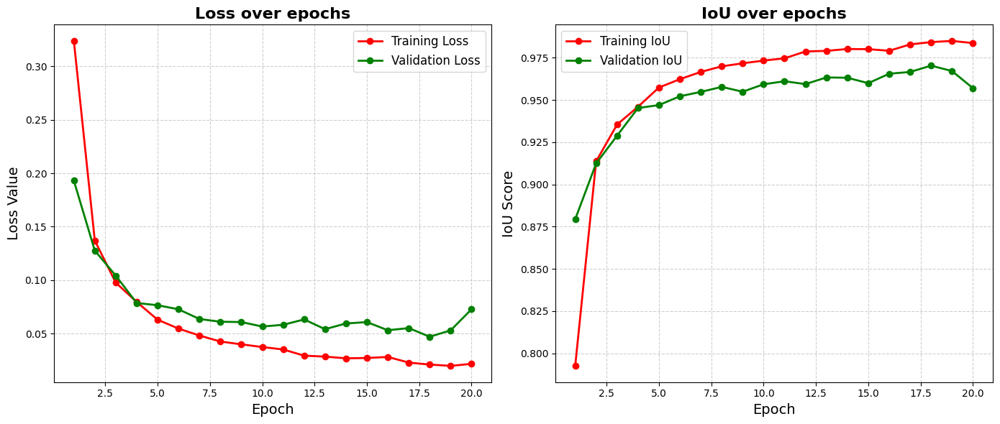

In [24]:
model = UNet(3, 16, 1)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters())

augmented_train_dataset = SelfieDataset(train_images, train_masks, transform=create_augmentation_pipeline())
combined_dataset = torch.utils.data.ConcatDataset([train_dataset, augmented_train_dataset])

train_loader = torch.utils.data.DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

history = train_model(model, optimizer, criterion, train_loader, val_loader)
visualize_training_history(history)


### Worst cases

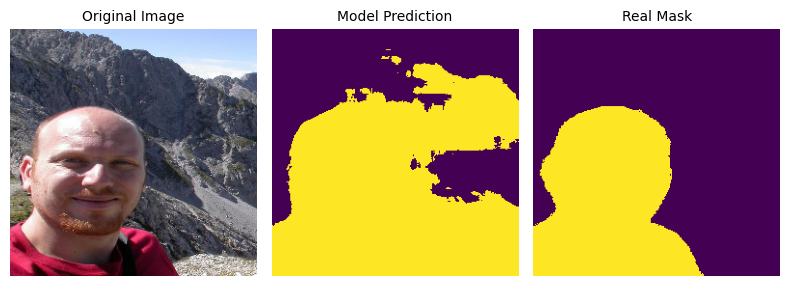

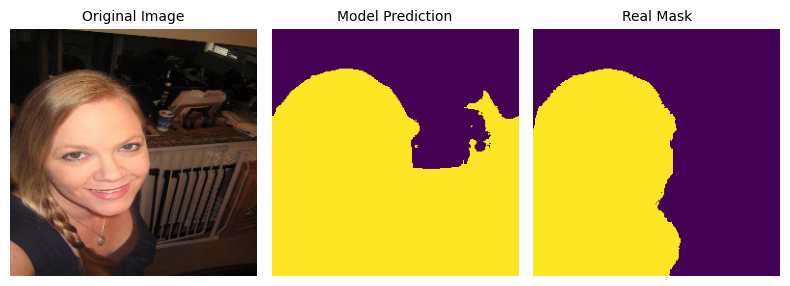

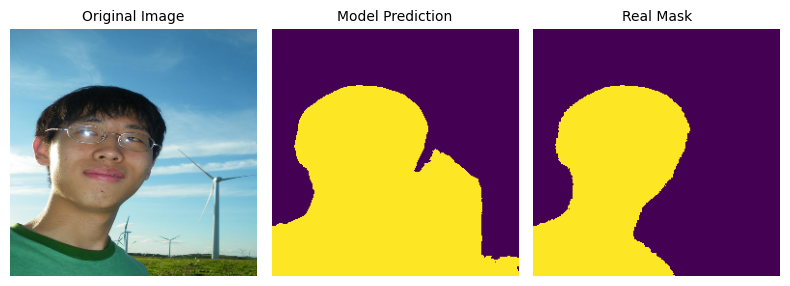

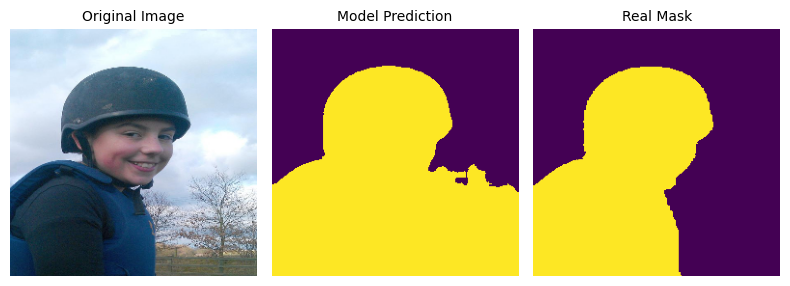

In [25]:
show_predictions(model, test_dataset, 4, best=False)

### Best cases

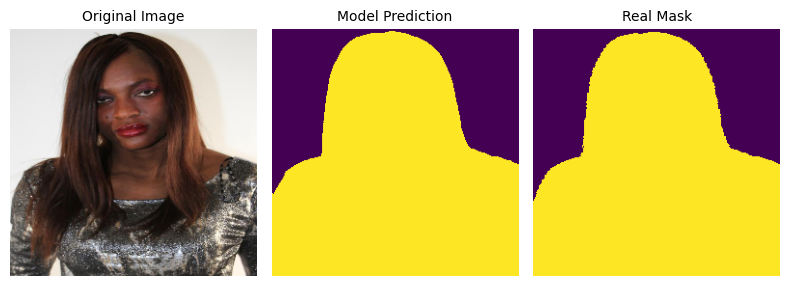

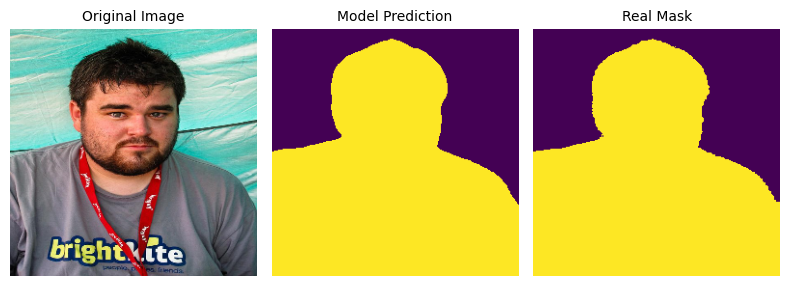

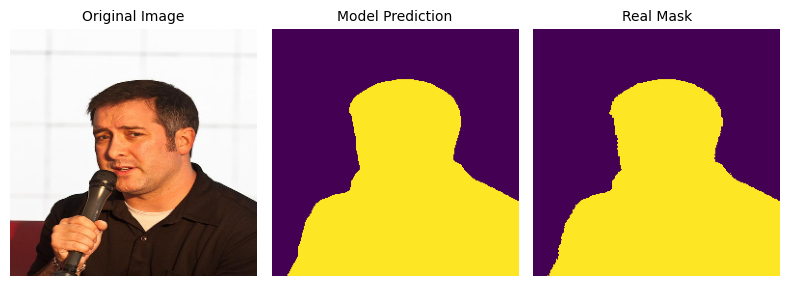

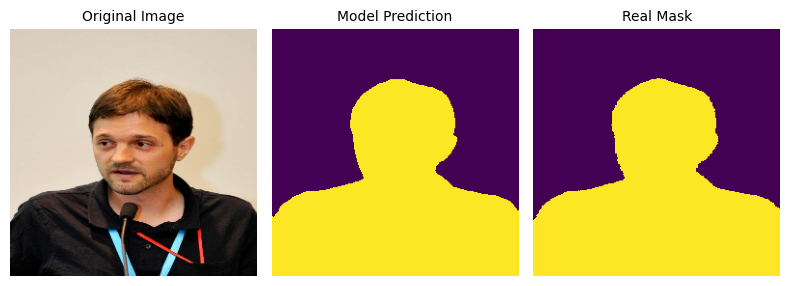

In [26]:
show_predictions(model, test_dataset, 4, best=True)

### Training on the full training dataset

In [27]:
model = UNet(3, 16, 1, depth=2)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters())

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

history = train_model(model, optimizer, criterion, train_loader, val_loader)


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.5408, Train IoU: 0.6052 | Val Loss: 0.6711, Val IoU: 0.5374


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.4649, Train IoU: 0.6589 | Val Loss: 0.4778, Val IoU: 0.6668


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.4165, Train IoU: 0.6965 | Val Loss: 0.4388, Val IoU: 0.6545


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.3859, Train IoU: 0.7185 | Val Loss: 0.4215, Val IoU: 0.6910


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.3694, Train IoU: 0.7328 | Val Loss: 0.4158, Val IoU: 0.6842


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.3536, Train IoU: 0.7441 | Val Loss: 0.3907, Val IoU: 0.6763


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.3402, Train IoU: 0.7524 | Val Loss: 0.3689, Val IoU: 0.7271


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.3403, Train IoU: 0.7547 | Val Loss: 0.3523, Val IoU: 0.7408


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.3193, Train IoU: 0.7685 | Val Loss: 0.3843, Val IoU: 0.7106


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.3073, Train IoU: 0.7771 | Val Loss: 0.3947, Val IoU: 0.6839


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.3040, Train IoU: 0.7806 | Val Loss: 0.4127, Val IoU: 0.7421


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.2960, Train IoU: 0.7847 | Val Loss: 0.3274, Val IoU: 0.7540


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.2875, Train IoU: 0.7921 | Val Loss: 0.2997, Val IoU: 0.7801


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.2823, Train IoU: 0.7963 | Val Loss: 0.3137, Val IoU: 0.7436


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.2742, Train IoU: 0.8022 | Val Loss: 0.3002, Val IoU: 0.7778


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.2664, Train IoU: 0.8080 | Val Loss: 0.2715, Val IoU: 0.7986


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.2645, Train IoU: 0.8090 | Val Loss: 0.2748, Val IoU: 0.7973


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.2578, Train IoU: 0.8142 | Val Loss: 0.2992, Val IoU: 0.7883


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.2567, Train IoU: 0.8145 | Val Loss: 0.2685, Val IoU: 0.8053


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.2479, Train IoU: 0.8218 | Val Loss: 0.3257, Val IoU: 0.7266


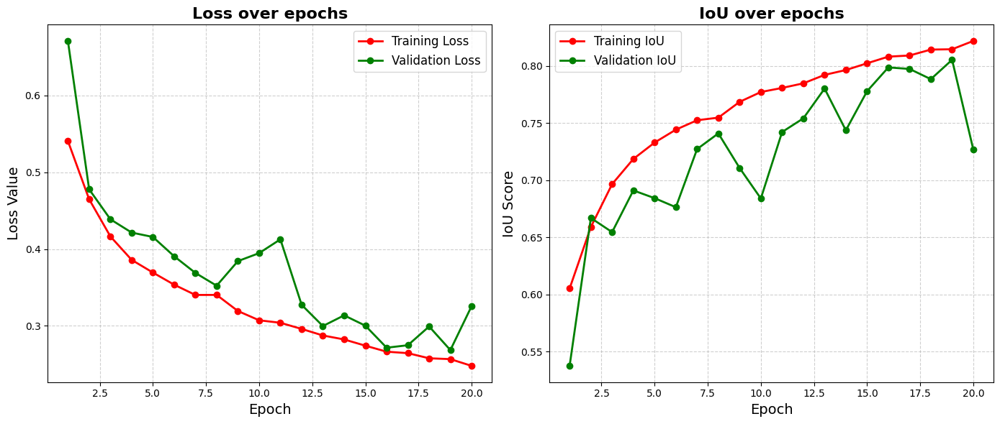

In [28]:
visualize_training_history(history)


### Worst cases

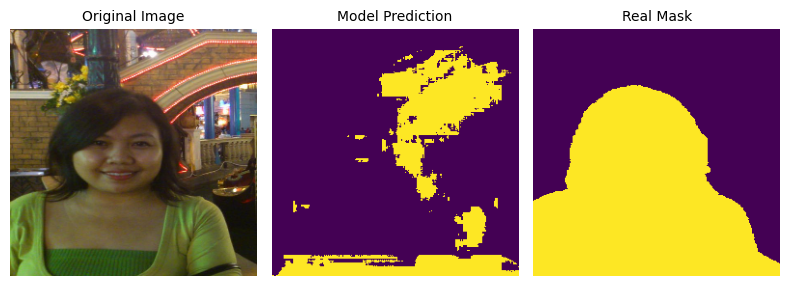

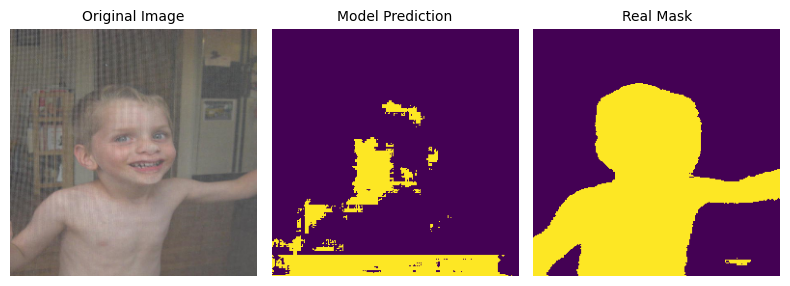

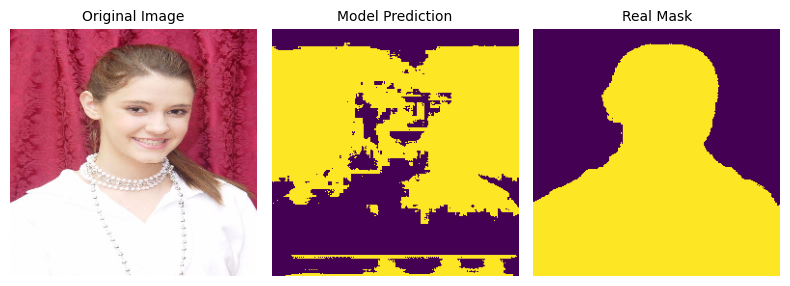

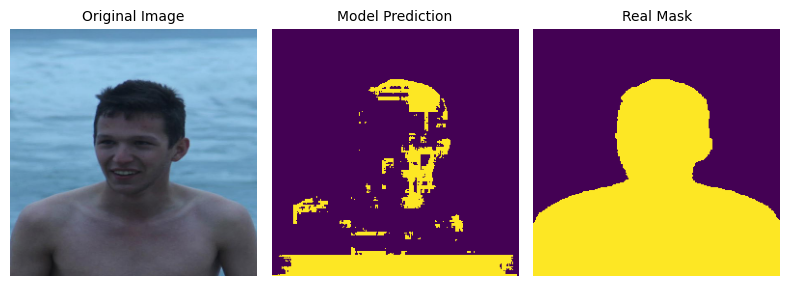

In [29]:
show_predictions(model, test_dataset, 4, best=False)

### Best cases

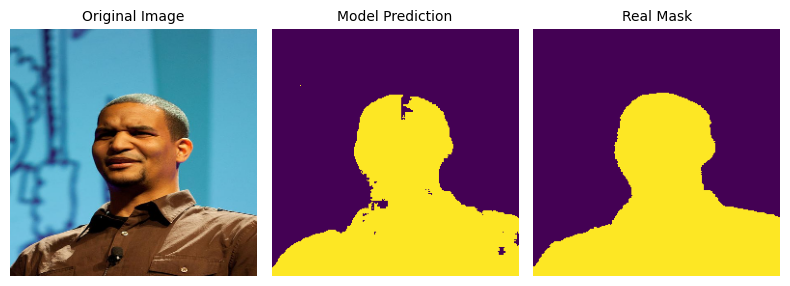

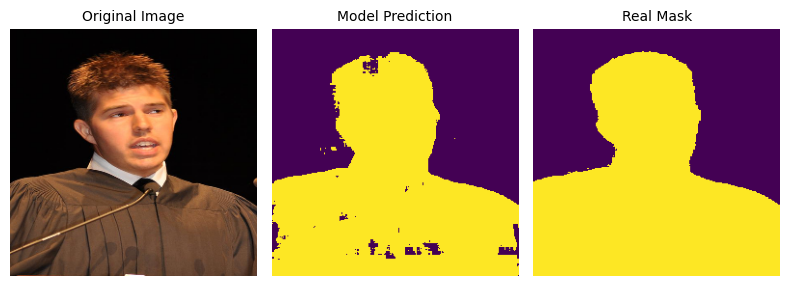

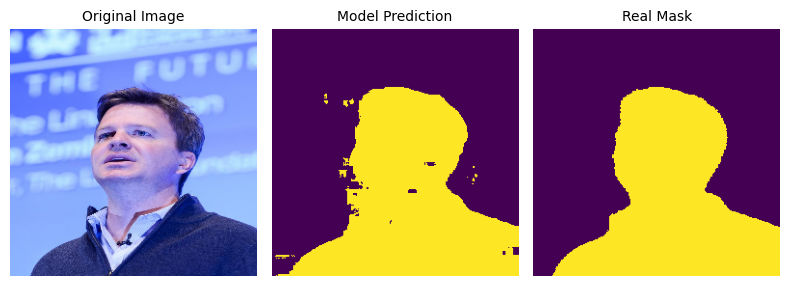

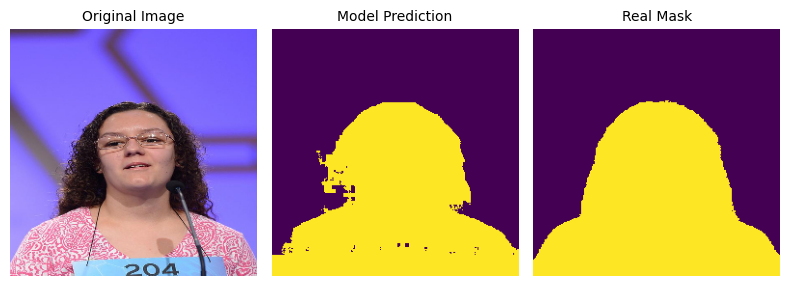

In [30]:
show_predictions(model, test_dataset, 4, best=True)

#### Уменьшение downsampleов до двух сильно ухудшает предсказывание

## KFold

In [31]:
class KFoldModels:
    def __init__(self, models, dataset, n_splits=5):
        self.kfold = KFold(n_splits=n_splits, shuffle=True, random_state=SEED)
        self.models = models
        self.n_splits = n_splits

        self.fold_train_indices = []
        self.fold_val_indices = []

        for train_idx, val_idx in self.kfold.split(dataset):
            self.fold_train_indices.append(train_idx)
            self.fold_val_indices.append(val_idx)

    def get_model(self, fold_idx):
        return self.models[fold_idx]

    def get_train_indices(self, fold_idx):
        return self.fold_train_indices[fold_idx]

    def get_val_indices(self, fold_idx):
        return self.fold_val_indices[fold_idx]


In [32]:
N_FOLDS = 5
complete_dataset = SelfieDataset(images_path, masks_path, transform=create_transform_pipeline())

fold_models = KFoldModels(
    [UNet(3, 16, 1) for _ in range(N_FOLDS)],
    complete_dataset,
    N_FOLDS
)

fold_histories = []

for fold in range(N_FOLDS):
    print(f"\n--- Training Fold {fold+1}/{N_FOLDS} ---")

    model = fold_models.get_model(fold)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters())

    train_loader = torch.utils.data.DataLoader(
        complete_dataset,
        batch_size=BATCH_SIZE,
        sampler=torch.utils.data.SubsetRandomSampler(fold_models.get_train_indices(fold))
    )

    val_loader = torch.utils.data.DataLoader(
        complete_dataset,
        batch_size=BATCH_SIZE,
        sampler=torch.utils.data.SubsetRandomSampler(fold_models.get_val_indices(fold))
    )

    fold_histories.append(train_model(model, optimizer, criterion, train_loader, val_loader))



--- Training Fold 1/5 ---


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3066, Train IoU: 0.6157 | Val Loss: 0.0488, Val IoU: 0.1702


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1568, Train IoU: 0.7054 | Val Loss: 0.0394, Val IoU: 0.1757


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.1138, Train IoU: 0.7265 | Val Loss: 0.0285, Val IoU: 0.1808


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0949, Train IoU: 0.7365 | Val Loss: 0.0261, Val IoU: 0.1828


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0763, Train IoU: 0.7488 | Val Loss: 0.0211, Val IoU: 0.1860


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0652, Train IoU: 0.7564 | Val Loss: 0.0209, Val IoU: 0.1860


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0579, Train IoU: 0.7609 | Val Loss: 0.0169, Val IoU: 0.1886


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0492, Train IoU: 0.7667 | Val Loss: 0.0156, Val IoU: 0.1895


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0490, Train IoU: 0.7664 | Val Loss: 0.0162, Val IoU: 0.1895


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0429, Train IoU: 0.7702 | Val Loss: 0.0157, Val IoU: 0.1891


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0372, Train IoU: 0.7740 | Val Loss: 0.0145, Val IoU: 0.1903


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0359, Train IoU: 0.7748 | Val Loss: 0.0157, Val IoU: 0.1901


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0334, Train IoU: 0.7766 | Val Loss: 0.0150, Val IoU: 0.1906


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0290, Train IoU: 0.7794 | Val Loss: 0.0155, Val IoU: 0.1903


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0288, Train IoU: 0.7794 | Val Loss: 0.0167, Val IoU: 0.1901


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0264, Train IoU: 0.7811 | Val Loss: 0.0159, Val IoU: 0.1912


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0217, Train IoU: 0.7844 | Val Loss: 0.0135, Val IoU: 0.1918


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0207, Train IoU: 0.7849 | Val Loss: 0.0160, Val IoU: 0.1913


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0274, Train IoU: 0.7801 | Val Loss: 0.0218, Val IoU: 0.1877


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0259, Train IoU: 0.7812 | Val Loss: 0.0151, Val IoU: 0.1910

--- Training Fold 2/5 ---


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3096, Train IoU: 0.5957 | Val Loss: 0.0510, Val IoU: 0.1664


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1654, Train IoU: 0.6964 | Val Loss: 0.0308, Val IoU: 0.1814


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.1195, Train IoU: 0.7215 | Val Loss: 0.0328, Val IoU: 0.1767


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0980, Train IoU: 0.7344 | Val Loss: 0.0228, Val IoU: 0.1848


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0820, Train IoU: 0.7440 | Val Loss: 0.0179, Val IoU: 0.1881


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0732, Train IoU: 0.7494 | Val Loss: 0.0177, Val IoU: 0.1878


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0618, Train IoU: 0.7578 | Val Loss: 0.0157, Val IoU: 0.1893


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0534, Train IoU: 0.7633 | Val Loss: 0.0147, Val IoU: 0.1902


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0509, Train IoU: 0.7645 | Val Loss: 0.0148, Val IoU: 0.1900


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0483, Train IoU: 0.7665 | Val Loss: 0.0144, Val IoU: 0.1904


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0405, Train IoU: 0.7721 | Val Loss: 0.0139, Val IoU: 0.1907


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0369, Train IoU: 0.7743 | Val Loss: 0.0126, Val IoU: 0.1913


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0328, Train IoU: 0.7772 | Val Loss: 0.0143, Val IoU: 0.1913


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0303, Train IoU: 0.7787 | Val Loss: 0.0126, Val IoU: 0.1915


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0311, Train IoU: 0.7777 | Val Loss: 0.0127, Val IoU: 0.1911


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0283, Train IoU: 0.7798 | Val Loss: 0.0121, Val IoU: 0.1918


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0243, Train IoU: 0.7826 | Val Loss: 0.0105, Val IoU: 0.1931


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0207, Train IoU: 0.7850 | Val Loss: 0.0116, Val IoU: 0.1926


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0220, Train IoU: 0.7840 | Val Loss: 0.0109, Val IoU: 0.1929


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0248, Train IoU: 0.7819 | Val Loss: 0.0176, Val IoU: 0.1889

--- Training Fold 3/5 ---


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3058, Train IoU: 0.6131 | Val Loss: 0.0490, Val IoU: 0.1683


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1634, Train IoU: 0.6977 | Val Loss: 0.0389, Val IoU: 0.1758


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.1204, Train IoU: 0.7206 | Val Loss: 0.0293, Val IoU: 0.1801


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0954, Train IoU: 0.7357 | Val Loss: 0.0224, Val IoU: 0.1850


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0789, Train IoU: 0.7465 | Val Loss: 0.0207, Val IoU: 0.1859


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0707, Train IoU: 0.7518 | Val Loss: 0.0172, Val IoU: 0.1881


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0620, Train IoU: 0.7570 | Val Loss: 0.0229, Val IoU: 0.1846


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0531, Train IoU: 0.7632 | Val Loss: 0.0156, Val IoU: 0.1896


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0523, Train IoU: 0.7640 | Val Loss: 0.0171, Val IoU: 0.1880


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0440, Train IoU: 0.7694 | Val Loss: 0.0147, Val IoU: 0.1897


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0416, Train IoU: 0.7712 | Val Loss: 0.0131, Val IoU: 0.1910


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0348, Train IoU: 0.7755 | Val Loss: 0.0127, Val IoU: 0.1914


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0357, Train IoU: 0.7747 | Val Loss: 0.0130, Val IoU: 0.1912


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0298, Train IoU: 0.7788 | Val Loss: 0.0149, Val IoU: 0.1908


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0271, Train IoU: 0.7807 | Val Loss: 0.0129, Val IoU: 0.1917


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0228, Train IoU: 0.7838 | Val Loss: 0.0122, Val IoU: 0.1922


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0219, Train IoU: 0.7842 | Val Loss: 0.0125, Val IoU: 0.1918


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0224, Train IoU: 0.7837 | Val Loss: 0.0140, Val IoU: 0.1913


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0241, Train IoU: 0.7824 | Val Loss: 0.0118, Val IoU: 0.1924


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0227, Train IoU: 0.7832 | Val Loss: 0.0128, Val IoU: 0.1915

--- Training Fold 4/5 ---


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3119, Train IoU: 0.6127 | Val Loss: 0.0565, Val IoU: 0.1673


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1740, Train IoU: 0.6955 | Val Loss: 0.0370, Val IoU: 0.1780


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.1236, Train IoU: 0.7224 | Val Loss: 0.0300, Val IoU: 0.1808


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0976, Train IoU: 0.7366 | Val Loss: 0.0231, Val IoU: 0.1845


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0793, Train IoU: 0.7476 | Val Loss: 0.0199, Val IoU: 0.1867


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0669, Train IoU: 0.7556 | Val Loss: 0.0191, Val IoU: 0.1869


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0603, Train IoU: 0.7593 | Val Loss: 0.0177, Val IoU: 0.1879


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0538, Train IoU: 0.7633 | Val Loss: 0.0181, Val IoU: 0.1877


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0455, Train IoU: 0.7691 | Val Loss: 0.0173, Val IoU: 0.1884


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0428, Train IoU: 0.7706 | Val Loss: 0.0199, Val IoU: 0.1863


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0391, Train IoU: 0.7727 | Val Loss: 0.0158, Val IoU: 0.1892


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0340, Train IoU: 0.7763 | Val Loss: 0.0143, Val IoU: 0.1901


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0360, Train IoU: 0.7745 | Val Loss: 0.0177, Val IoU: 0.1888


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0318, Train IoU: 0.7774 | Val Loss: 0.0136, Val IoU: 0.1909


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0272, Train IoU: 0.7806 | Val Loss: 0.0148, Val IoU: 0.1905


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0241, Train IoU: 0.7827 | Val Loss: 0.0131, Val IoU: 0.1918


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0218, Train IoU: 0.7844 | Val Loss: 0.0134, Val IoU: 0.1915


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0211, Train IoU: 0.7846 | Val Loss: 0.0167, Val IoU: 0.1894


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0206, Train IoU: 0.7850 | Val Loss: 0.0147, Val IoU: 0.1913


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0277, Train IoU: 0.7798 | Val Loss: 0.0174, Val IoU: 0.1896

--- Training Fold 5/5 ---


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.3278, Train IoU: 0.6030 | Val Loss: 0.0586, Val IoU: 0.1616


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1802, Train IoU: 0.6898 | Val Loss: 0.0385, Val IoU: 0.1754


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.1248, Train IoU: 0.7194 | Val Loss: 0.0307, Val IoU: 0.1795


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0986, Train IoU: 0.7349 | Val Loss: 0.0263, Val IoU: 0.1825


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0816, Train IoU: 0.7451 | Val Loss: 0.0221, Val IoU: 0.1845


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0711, Train IoU: 0.7520 | Val Loss: 0.0202, Val IoU: 0.1862


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0636, Train IoU: 0.7566 | Val Loss: 0.0189, Val IoU: 0.1874


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0563, Train IoU: 0.7611 | Val Loss: 0.0158, Val IoU: 0.1895


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0468, Train IoU: 0.7681 | Val Loss: 0.0154, Val IoU: 0.1893


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0422, Train IoU: 0.7708 | Val Loss: 0.0154, Val IoU: 0.1895


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0420, Train IoU: 0.7710 | Val Loss: 0.0143, Val IoU: 0.1901


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0377, Train IoU: 0.7735 | Val Loss: 0.0144, Val IoU: 0.1908


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0343, Train IoU: 0.7755 | Val Loss: 0.0166, Val IoU: 0.1886


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0330, Train IoU: 0.7766 | Val Loss: 0.0137, Val IoU: 0.1913


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0274, Train IoU: 0.7805 | Val Loss: 0.0134, Val IoU: 0.1911


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0274, Train IoU: 0.7803 | Val Loss: 0.0135, Val IoU: 0.1915


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0268, Train IoU: 0.7806 | Val Loss: 0.0143, Val IoU: 0.1902


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0271, Train IoU: 0.7805 | Val Loss: 0.0143, Val IoU: 0.1910


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0250, Train IoU: 0.7817 | Val Loss: 0.0180, Val IoU: 0.1897


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0282, Train IoU: 0.7794 | Val Loss: 0.0140, Val IoU: 0.1909


Fold 1 Performance Curves:


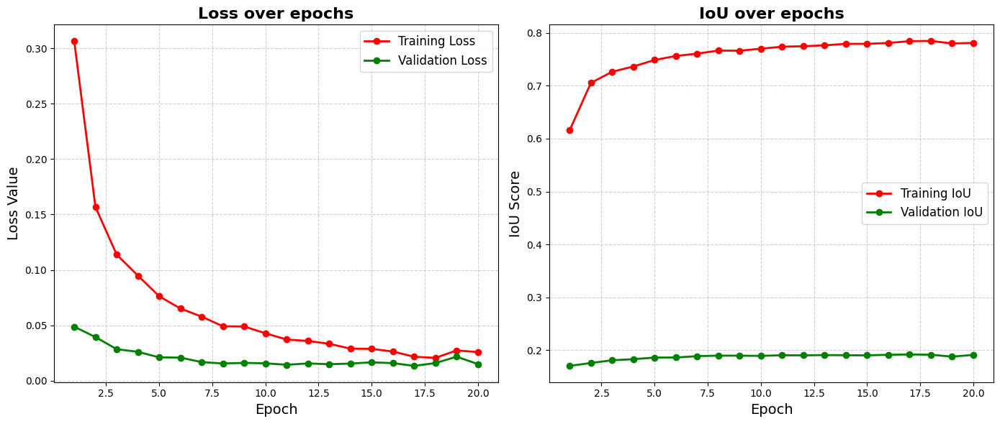

Fold 2 Performance Curves:


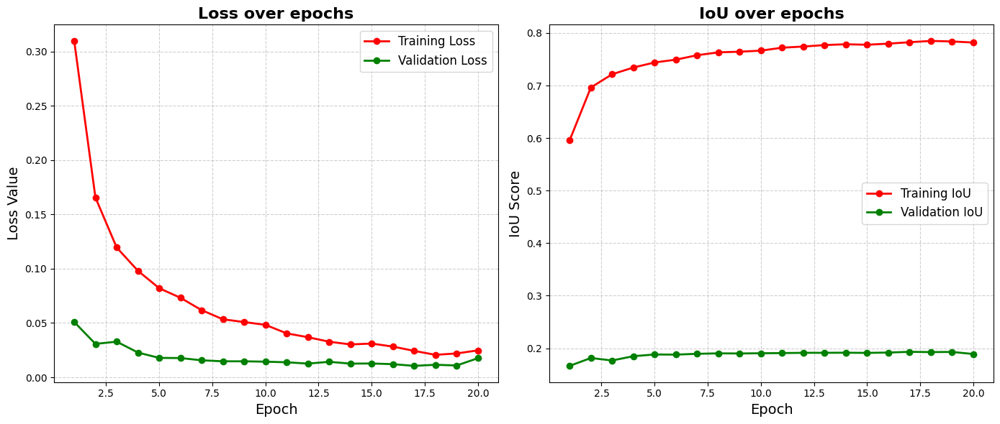

Fold 3 Performance Curves:


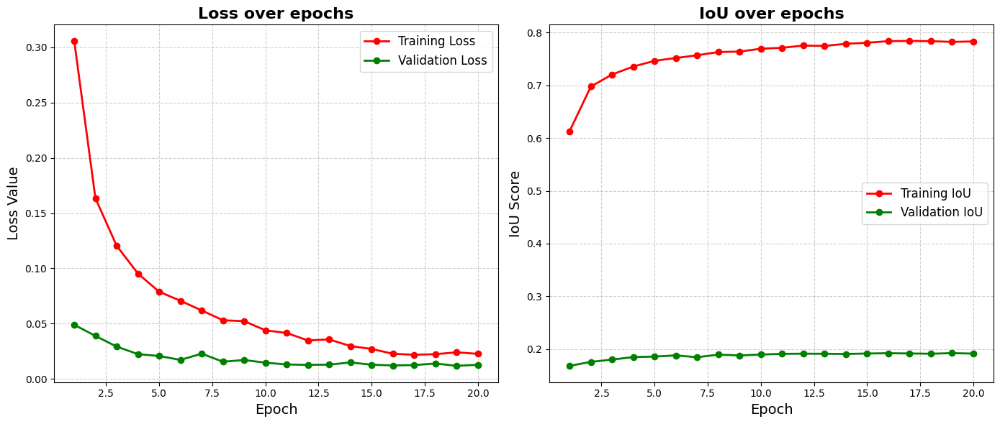

Fold 4 Performance Curves:


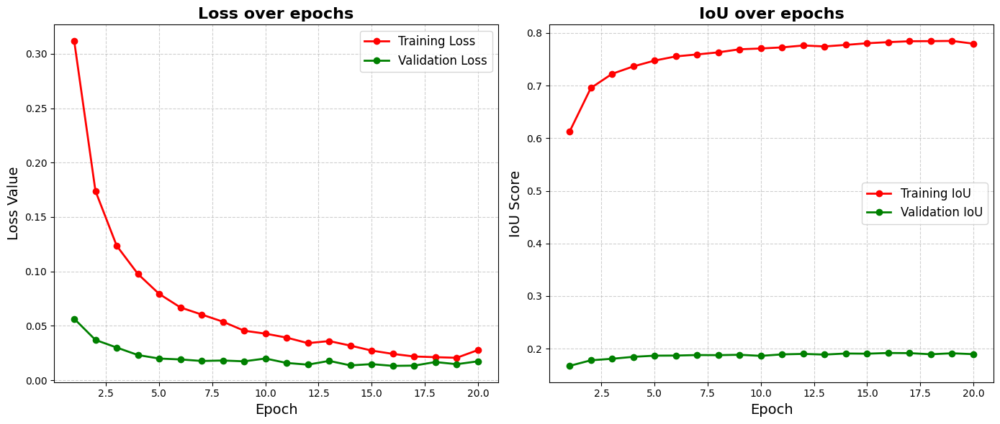

Fold 5 Performance Curves:


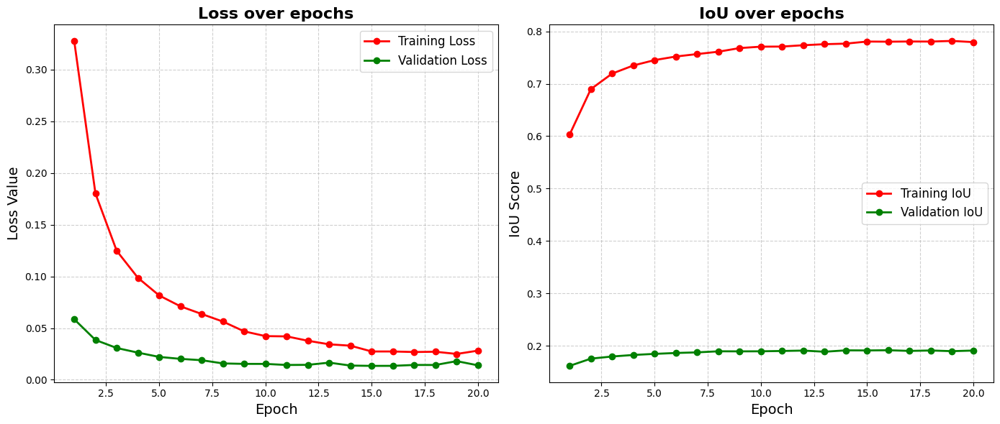

In [33]:
for i, history in enumerate(fold_histories):
    print(f"Fold {i+1} Performance Curves:")
    visualize_training_history(history)


На тестовой выборке метрика для ансамбля оказалася лучше примерно на 0.15, чем для одной модели

In [34]:
def ensemble_prediction(models, image_batch):
    predictions = []
    for model in models:
        model.eval()
        with torch.no_grad():
            pred = model(image_batch)
            predictions.append(pred)

    return torch.cat(predictions, dim=1).mean(dim=1)


In [35]:
ensemble_iou = 0
batch_count = 0
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

for images, masks in tqdm(test_loader, desc="Evaluating ensemble on test set"):
    batch_count += 1
    images = images.to(DEVICE)
    masks = masks.to(DEVICE)

    ensemble_pred = ensemble_prediction(fold_models.models, images)
    ensemble_iou += jaccard_index(ensemble_pred, masks)

ensemble_iou /= batch_count
print(f"Ensemble of {N_FOLDS} models IoU score: {ensemble_iou:.6f}")

Evaluating ensemble on test set:   0%|          | 0/25 [00:00<?, ?it/s]

Ensemble of 5 models IoU score: 0.983096


In [36]:
# def show_ensemble_worst_predictions(models, dataset, n=4):
#     results = []

#     for i, (image, mask) in enumerate(dataset):
#         with torch.no_grad():
#             pred = ensemble_prediction(models, torch.from_numpy(image).to(DEVICE).unsqueeze(0))
#             score = jaccard_index(pred, torch.from_numpy(mask).to(DEVICE))
#             results.append((score, i))

#     worst_cases = sorted(results, key=lambda x: x[0])[:n]
#     samples = []

#     for _, idx in worst_cases:
#         image, mask = dataset[idx]
#         with torch.no_grad():
#             single_pred = fold_models.models[0](torch.from_numpy(image).to(DEVICE).unsqueeze(0)).squeeze()
#             single_mask = (torch.sigmoid(single_pred) >= 0.5).float().cpu().numpy()

#             ensemble_pred = ensemble_prediction(models, torch.from_numpy(image).to(DEVICE).unsqueeze(0)).squeeze()
#             ensemble_mask = (torch.sigmoid(ensemble_pred) >= 0.5).float().cpu().numpy()

#         samples.append(image.transpose(1, 2, 0))
#         samples.append(single_mask)
#         samples.append(ensemble_mask)
#         samples.append(mask)


#     # show_images(samples, column_num=4, column_titles=["Original Image", "Single Model", "Ensemble", "Ground Truth"])

#     for sample in samples:
#         _, axes = plt.subplots(1, 4, figsize=(20, 6))
#         titles = ["Original Image", "Single Model", "Ensemble", "Ground Truth"]

#         for i, (img, title) in enumerate(zip(sample, titles)):
#             axes[i].imshow(img)
#             axes[i].set_title(title, fontsize=14)
#             axes[i].axis('off')

#         plt.tight_layout()
#         plt.show()


In [40]:
def show_ensemble_worst_predictions(models, dataset, n=4):
    results = []

    for i, (image, mask) in enumerate(dataset):
        with torch.no_grad():
            pred = ensemble_prediction(models, torch.from_numpy(image).to(DEVICE).unsqueeze(0))
            target = torch.from_numpy(mask).to(DEVICE)
            if target.dim() == 2:
                target = target.unsqueeze(0)
            score = jaccard_index(pred, target)
            results.append((score, i))

    worst_cases = sorted(results, key=lambda x: x[0])[:n]
    samples = []

    for _, idx in worst_cases:
        image, mask = dataset[idx]
        image_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)

        with torch.no_grad():
            single_pred = fold_models.models[0](image_tensor).squeeze()
            single_mask = (torch.sigmoid(single_pred) >= 0.5).float().cpu().numpy()

            ensemble_pred = ensemble_prediction(models, image_tensor).squeeze()
            ensemble_mask = (torch.sigmoid(ensemble_pred) >= 0.5).float().cpu().numpy()

        samples.append([
            image.transpose(1, 2, 0),  # C×H×W → H×W×C
            single_mask,
            ensemble_mask,
            mask
        ])

    titles = ["Original Image", "Single Model", "Ensemble", "Ground Truth"]
    for sample in samples:
        fig, axes = plt.subplots(1, 4, figsize=(20, 6))
        for i, (img, title) in enumerate(zip(sample, titles)):
            axes[i].imshow(img, cmap='gray' if img.ndim == 2 else None)
            axes[i].set_title(title, fontsize=14)
            axes[i].axis('off')
        plt.tight_layout()
        plt.show()


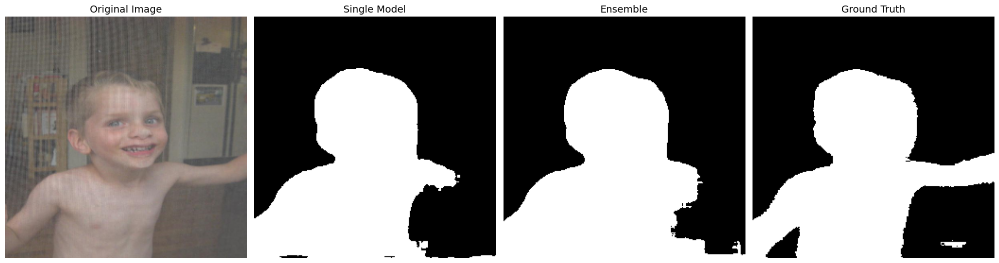

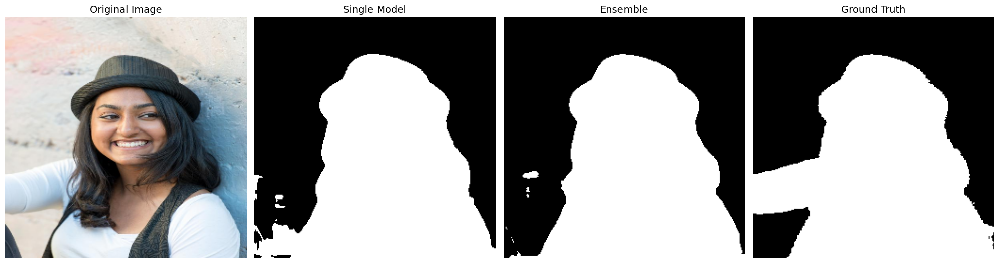

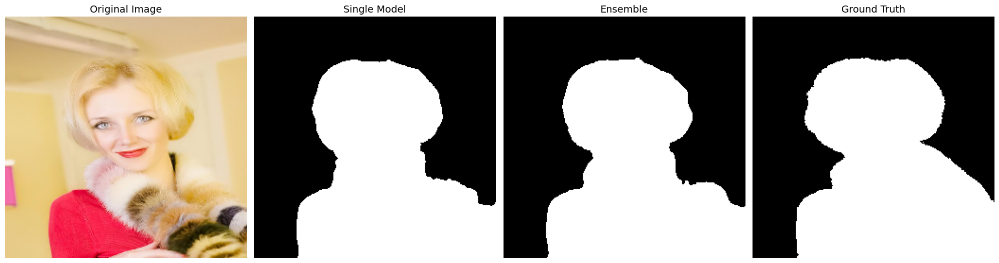

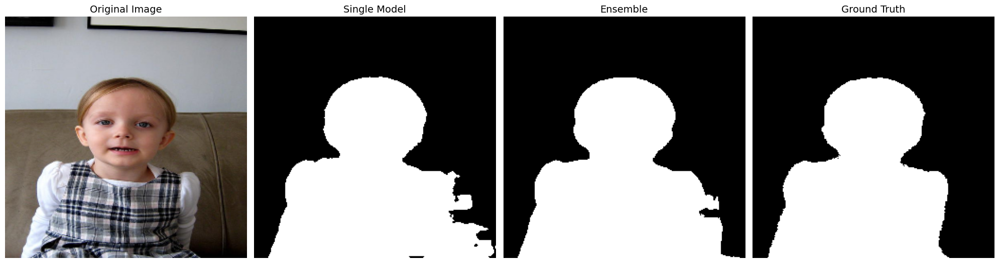

In [41]:
show_ensemble_worst_predictions(fold_models.models, test_dataset, 4)


Training UNet with pretrained ResNet18 encoder:


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 221MB/s]


Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.2042, Train IoU: 0.9270 | Val Loss: 0.1435, Val IoU: 0.9593


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.1201, Train IoU: 0.9684 | Val Loss: 0.1101, Val IoU: 0.9663


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.0934, Train IoU: 0.9735 | Val Loss: 0.0896, Val IoU: 0.9691


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.0744, Train IoU: 0.9781 | Val Loss: 0.0740, Val IoU: 0.9713


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.0623, Train IoU: 0.9799 | Val Loss: 0.0666, Val IoU: 0.9713


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.0529, Train IoU: 0.9816 | Val Loss: 0.0592, Val IoU: 0.9728


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.0458, Train IoU: 0.9829 | Val Loss: 0.0538, Val IoU: 0.9727


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.0409, Train IoU: 0.9836 | Val Loss: 0.0493, Val IoU: 0.9744


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.0362, Train IoU: 0.9848 | Val Loss: 0.0470, Val IoU: 0.9747


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.0322, Train IoU: 0.9861 | Val Loss: 0.0459, Val IoU: 0.9741


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.0292, Train IoU: 0.9868 | Val Loss: 0.0429, Val IoU: 0.9755


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.0270, Train IoU: 0.9872 | Val Loss: 0.0412, Val IoU: 0.9749


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.0251, Train IoU: 0.9876 | Val Loss: 0.0398, Val IoU: 0.9758


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.0234, Train IoU: 0.9880 | Val Loss: 0.0394, Val IoU: 0.9763


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.0217, Train IoU: 0.9885 | Val Loss: 0.0383, Val IoU: 0.9766


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.0205, Train IoU: 0.9888 | Val Loss: 0.0373, Val IoU: 0.9763


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.0193, Train IoU: 0.9892 | Val Loss: 0.0369, Val IoU: 0.9767


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.0184, Train IoU: 0.9894 | Val Loss: 0.0381, Val IoU: 0.9761


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.0175, Train IoU: 0.9898 | Val Loss: 0.0365, Val IoU: 0.9771


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.0173, Train IoU: 0.9895 | Val Loss: 0.0412, Val IoU: 0.9733


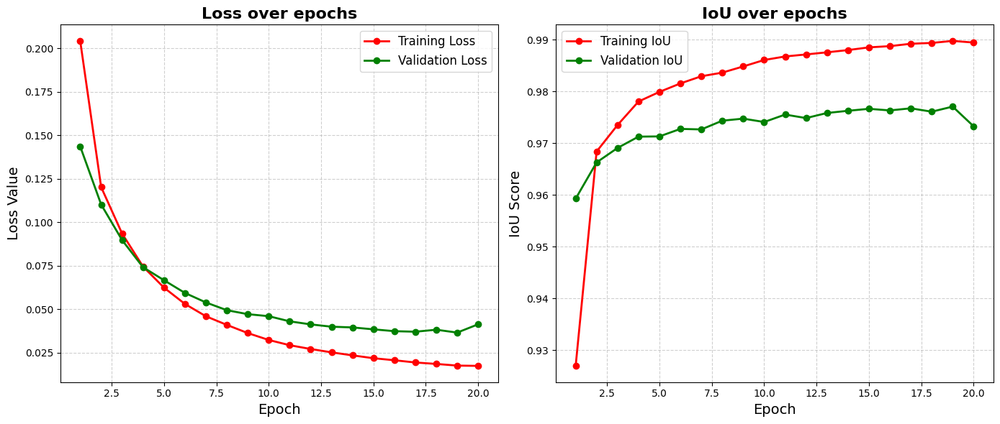

Worst cases


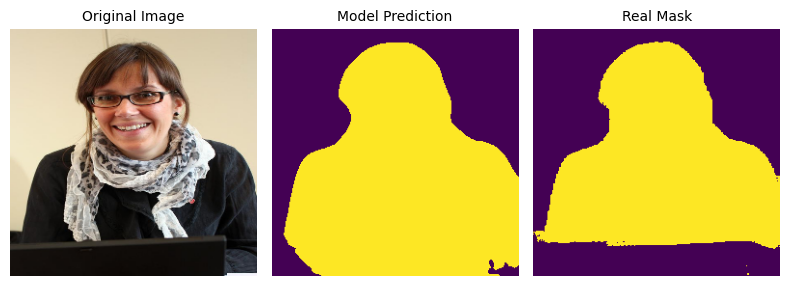

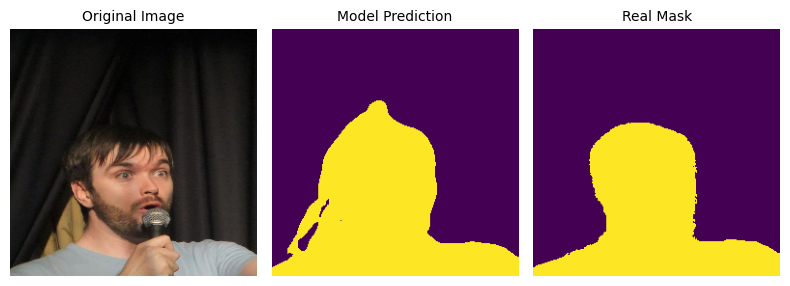

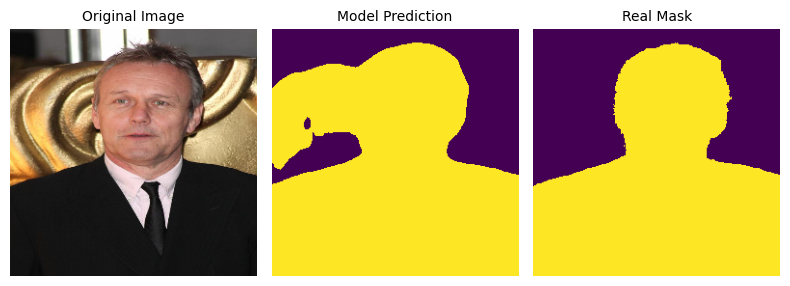

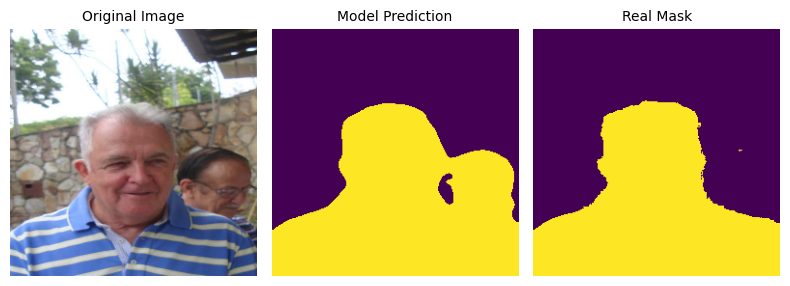

Best cases


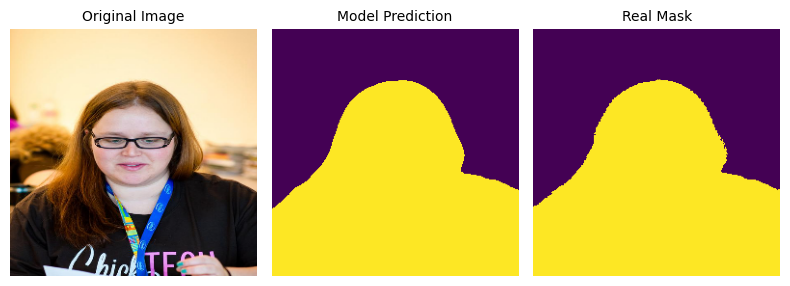

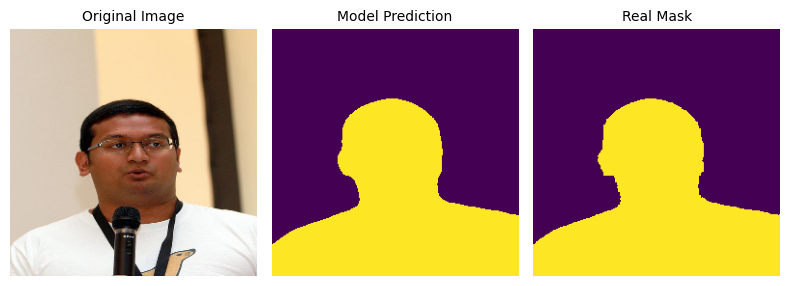

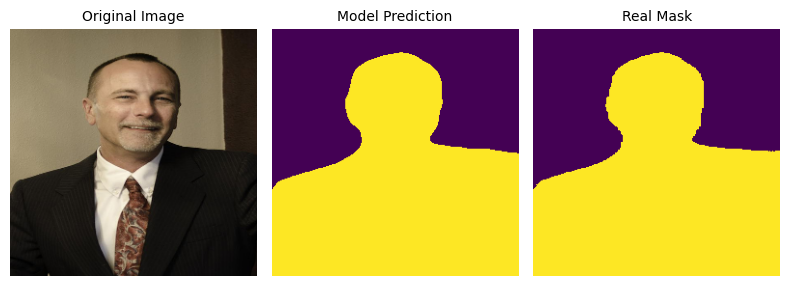

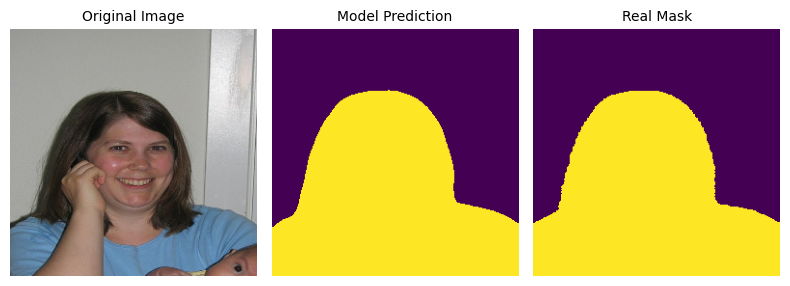

Training epoch 1/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.5910, Train IoU: 0.3781 | Val Loss: 0.4586, Val IoU: 0.7999


Training epoch 2/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 2/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.4394, Train IoU: 0.8359 | Val Loss: 0.3944, Val IoU: 0.8490


Training epoch 3/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 3/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.3888, Train IoU: 0.8741 | Val Loss: 0.3658, Val IoU: 0.8737


Training epoch 4/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 4/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.3533, Train IoU: 0.8940 | Val Loss: 0.3436, Val IoU: 0.8832


Training epoch 5/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 5/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.3244, Train IoU: 0.9071 | Val Loss: 0.3077, Val IoU: 0.8911


Training epoch 6/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 6/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.2980, Train IoU: 0.9177 | Val Loss: 0.2985, Val IoU: 0.8872


Training epoch 7/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 7/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.2756, Train IoU: 0.9252 | Val Loss: 0.2704, Val IoU: 0.9053


Training epoch 8/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 8/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.2526, Train IoU: 0.9350 | Val Loss: 0.2629, Val IoU: 0.8999


Training epoch 9/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 9/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.2341, Train IoU: 0.9398 | Val Loss: 0.2396, Val IoU: 0.9124


Training epoch 10/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 10/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.2156, Train IoU: 0.9455 | Val Loss: 0.2231, Val IoU: 0.9172


Training epoch 11/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 11/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.2001, Train IoU: 0.9493 | Val Loss: 0.2257, Val IoU: 0.9085


Training epoch 12/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 12/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.1840, Train IoU: 0.9553 | Val Loss: 0.2040, Val IoU: 0.9215


Training epoch 13/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 13/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.1684, Train IoU: 0.9612 | Val Loss: 0.1902, Val IoU: 0.9238


Training epoch 14/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 14/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.1578, Train IoU: 0.9614 | Val Loss: 0.1862, Val IoU: 0.9206


Training epoch 15/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 15/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.1453, Train IoU: 0.9657 | Val Loss: 0.1773, Val IoU: 0.9210


Training epoch 16/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 16/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.1340, Train IoU: 0.9689 | Val Loss: 0.1658, Val IoU: 0.9279


Training epoch 17/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 17/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.1226, Train IoU: 0.9732 | Val Loss: 0.1598, Val IoU: 0.9301


Training epoch 18/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 18/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.1154, Train IoU: 0.9731 | Val Loss: 0.1561, Val IoU: 0.9286


Training epoch 19/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 19/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.1073, Train IoU: 0.9746 | Val Loss: 0.1487, Val IoU: 0.9269


Training epoch 20/20:   0%|          | 0/100 [00:00<?, ?it/s]

Validation epoch 20/20:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.1025, Train IoU: 0.9733 | Val Loss: 0.1438, Val IoU: 0.9315

Comparing standard UNet and UNet with ResNet18:


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

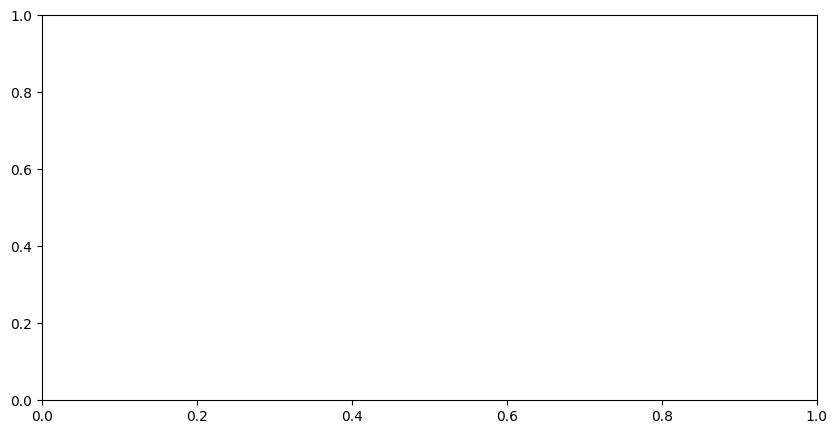

In [42]:
class UNetWithResNet18(nn.Module):
    def __init__(self, num_classes=1):
        super(UNetWithResNet18, self).__init__()

        base_model = models.resnet18(pretrained=True)

        self.first_conv = nn.Sequential(base_model.conv1, base_model.bn1, base_model.relu)
        self.maxpool = base_model.maxpool
        self.enc1 = base_model.layer1
        self.enc2 = base_model.layer2
        self.enc3 = base_model.layer3
        self.enc4 = base_model.layer4

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.dec4 = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.dec3 = nn.Sequential(
            nn.Conv2d(256 + 256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        self.dec2 = nn.Sequential(
            nn.Conv2d(128 + 128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.dec1 = nn.Sequential(
            nn.Conv2d(64 + 64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.final = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.first_conv(x)
        p1 = self.maxpool(x1)

        x2 = self.enc1(p1)
        x3 = self.enc2(x2)
        x4 = self.enc3(x3)
        x5 = self.enc4(x4)

        d4 = self.upsample(x5)
        d4 = self.dec4(d4)
        d4 = torch.cat([d4, x4], dim=1)

        d3 = self.upsample(d4)
        d3 = self.dec3(d3)
        d3 = torch.cat([d3, x3], dim=1)

        d2 = self.upsample(d3)
        d2 = self.dec2(d2)
        d2 = torch.cat([d2, x2], dim=1)

        d1 = self.upsample(d2)
        d1 = self.dec1(d1)

        out = self.upsample(d1)

        return self.final(out)

print("Training UNet with pretrained ResNet18 encoder:")
pretrained_model = UNetWithResNet18().to(DEVICE)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(pretrained_model.parameters(), lr=0.0001)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE)

pretrained_history = train_model(pretrained_model, optimizer, criterion, train_loader, val_loader)
visualize_training_history(pretrained_history)

print("Worst cases")
show_predictions(pretrained_model, test_dataset, 4, best=False)
print("Best cases")
show_predictions(pretrained_model, test_dataset, 4, best=True)

base_model = UNet(3, 16, 1)
base_model = base_model.to(DEVICE)  # Move base model to device too
base_optimizer = torch.optim.Adam(base_model.parameters(), lr=0.0001)
base_history = train_model(base_model, base_optimizer, criterion, train_loader, val_loader)

print("\nComparing standard UNet and UNet with ResNet18:")
plt.figure(figsize=(10, 5))
plt.plot(range(1, EPOCHS + 1), base_history["val_iou"], 'o-', label='Base UNet')
plt.plot(range(1, EPOCHS + 1), pretrained_history["val_iou"], 'o-', label='UNet with ResNet18')
plt.title('IoU Metric Comparison')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()
plt.grid(True)
plt.show()

print(f"Base UNet IoU: {max(base_history['val_iou']):.4f}")
print(f"UNet with ResNet18 IoU: {max(pretrained_history['val_iou']):.4f}")


In [43]:
print(f"Base UNet IoU: {max(base_history['val_iou']):.4f}")
print(f"UNet with ResNet18 IoU: {max(pretrained_history['val_iou']):.4f}")

Base UNet IoU: 0.9315
UNet with ResNet18 IoU: 0.9771


Как видим использование pretrained энкодера повышает точность на 0.044